## **Analysis Pipeline for Whrath Data from Novel Object Task/Ripple Disruption**

In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
import nelpy as nel
import nelpy.plotting as npl
import jagular as jag
import ghostipy as gsp
from numpy.fft import fft

import logging
import logging.config
logging.basicConfig(level=logging.ERROR) 

warnings.simplefilter("ignore", UserWarning)

/home/kaylavokt/nelpy/nelpy/plotting/decoding.py:9: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.


## Starting Over Kernel

In [2]:
## If starting over Kernel:
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
import nelpy as nel
import nelpy.plotting as npl
import jagular as jag
import ghostipy as gsp
from numpy.fft import fft
warnings.simplefilter("ignore", UserWarning)


prefix = '/home/kaylavokt/Desktop/Whrath/Disruption_Day1/'
rec_list = ['preFamSleep', 'postTestSleep']

path = prefix + 'lfp.npy'
lfp = np.load(path, allow_pickle=True).item()
print("lfp")
print(lfp)
    
path = prefix + 'denoised_epochs.npy'
denoised = np.load(path, allow_pickle=True).item()
print("denoised")
print(denoised)

path = prefix + 'td_ratios.npy'
td_ratios = np.load(path, allow_pickle=True).item()
print("td_ratios")

path = prefix + 'ripple_epochs.npy'
ripple_epochs = np.load(path, allow_pickle=True).item()
print("ripple_epochs")
print(ripple_epochs)

print("Done")

/home/kaylavokt/nelpy/nelpy/plotting/decoding.py:9: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.


lfp
{'preFamSleep': <AnalogSignalArray at 0x7faba8a99b70: 1 signals> for a total of 20:00 minutes, 'postTestSleep': <AnalogSignalArray at 0x7faba89ba9b0: 1 signals> for a total of 20:00 minutes}
denoised
{'preFamSleep': <AnalogSignalArray at 0x7faba89ba860: 1 signals (6 segments)> for a total of 19:59:018 minutes, 'postTestSleep': <AnalogSignalArray at 0x7faba67154e0: 1 signals (7 segments)> for a total of 19:53:297 minutes}
td_ratios
ripple_epochs
{'preFamSleep': <EpochArray at 0x7faba67152b0: 312 epochs> of length 33.681 seconds, 'postTestSleep': <EpochArray at 0x7faba6715ef0: 269 epochs> of length 33.5923999999999999 seconds}
Done


In [ ]:
ripples = ripple_epochs[rec_list[0]]
signal = lfp[rec_list[0]]
fs = 3000

coefs_cwt, _, f_cwt, t_cwt, _ = gsp.cwt(signal.data[0], fs=fs,freq_limits=[100, 400])
gsp.plot_wavelet_spectrogram(coefs_cwt, f_cwt,t_cwt)


## First Get Channel Data for Each Recording Type

In [5]:
# Pull in Data from Channel 27, This channel looked the best from File Playback

# 0 PreFamSleep
# 1 Fam* (Disruption)
# 2 PostFamSleep* (Disruption)
# 3 Test
# 4 PostTestSleep

In [2]:
# prefix = '/home/kaylavokt/Desktop/Whrath/Disruption_Day1/'
# prefix = '/home/kaylavokt/Desktop/Whrath/Disruption_Day3/'
# prefix = '/home/kaylavokt/Desktop/Whrath/Control_Day4/'
prefix = '/home/kaylavokt/Desktop/Whrath/Control_Day5/'


rec_list = ['preFamSleep', 'postTestSleep']

# for i in range(len(rec_list)):
#     rec = rec_list[i]
#     files = prefix + rec + '.rec'
#     os.system("mkdir " + prefix + rec + "_channels")

#     # Jagular Extraction Stuff

#     jfm = jag.io.JagularFileMap(files)
#     max_gap_size = 10000
#     ts_out = prefix + rec + '_timestamps.raw'
#     ch_out_prefix = prefix + rec + '_channels/'
#     # subset = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
#     subset = [1, 10]
#     block_size = 2**21
#     verbose = False

#     jag.utils.extract_channels(
#        jfm = jfm,
#        max_gap_size = max_gap_size,
#        ts_out = ts_out,
#        ch_out_prefix = ch_out_prefix,
#        subset = subset,
#        block_size = block_size,
#        verbose = verbose
#     )
    
#     print(files)

In [3]:
def loadUpData(prefix, rec, channels, verbose=True):
    # loadUpData: this function takes in the filepath and type of recording
    # ['preFamSleep', 'fam', 'postFamSleep', 'test', 'postTestSleep']
    # and generates a nelpy analog signal array

    ts = np.fromfile(prefix + rec + '_timestamps.raw', dtype = np.uint32)

    chdata = []
    for i in range(len(channels)):
        if(channels[i]<10):
            chdata.append(np.fromfile(prefix + rec + "_channels/ch.0" + str(channels[i]) + ".raw",dtype=np.int16)*0.195)
            if(verbose):
                print(prefix + rec + "_channels/ch.0" + str(channels[i]) + ".raw")
        else:
            chdata.append(np.fromfile(prefix + rec + "_channels/ch." + str(channels[i]) + ".raw",dtype=np.int16)*0.195)
            if(verbose):
                print(prefix + rec + "_channels/ch." + str(channels[i]) + ".raw")
    
    chdata = np.asarray(chdata)
    return nel.AnalogSignalArray(
    chdata,
    abscissa_vals=(ts-ts[0])/30000,
    )

In [4]:
lfp = {}

for i in range(len(rec_list)):
    rec = rec_list[i]
    # channels = [10]
    channels = [1] # CHANGING TETRODE CHANNEL HERE 
    
    # data = loadUpData(prefix, rec, channels, True)
    
#     tot_time = data.time[-1]
    
#     if tot_time >= 1210:
#         stop = data.time[-1] - 10 # Get 10 Seconds Before Last Timestamp of Data
#         start = stop - 1200 # Get 20 Minutes Prior to that
#     else:
#         stop = data.time[-1]
#         start = stop - 1200

    # lfp[rec] = data[nel.EpochArray([start,stop])]
    lfp[rec] = loadUpData(prefix, rec, channels, True)

print(lfp)
    

/home/kaylavokt/Desktop/Whrath/Control_Day5/preFamSleep_channels/ch.01.raw
/home/kaylavokt/Desktop/Whrath/Control_Day5/postTestSleep_channels/ch.01.raw
{'preFamSleep': <AnalogSignalArray at 0x7f94cae3f128: 1 signals> for a total of 20:03:992 minutes, 'postTestSleep': <AnalogSignalArray at 0x7f94c0a0d908: 1 signals> for a total of 20:57:584 minutes}


In [5]:
path = prefix + 'lfp.npy'
np.save(path, lfp)
print("saved LFP")

saved LFP


## Raw LFP Plots

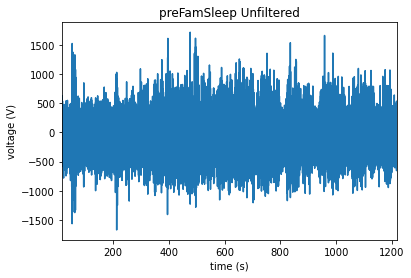

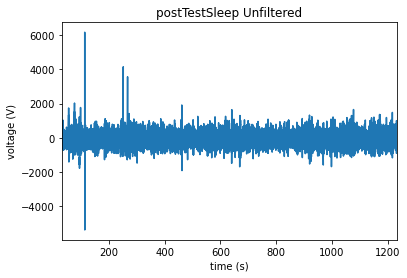

In [5]:
rec_list = ['preFamSleep', 'postTestSleep']

ax = plt.gca()
npl.plot(lfp['preFamSleep'])
ax.set_title("preFamSleep Unfiltered")
plt.show()

ax = plt.gca()
npl.plot(lfp['postTestSleep'])
ax.set_title("postTestSleep Unfiltered")
plt.show()

## Get Rid of Obvious Noise

In [6]:
# Get Mean Amplitude Across Entire Time Signal
# ? (Possible) Filter Data Above 300 Hz (if we only want ripple data) 
# If data crosses above 3 SD above the mean, consider this noise

# Remove these chunks with ~EpochArray or
# Start with computing FFT for each signal
# to see what frequency band the noise occurs to adjust filtering 

# signal = lfp['postTestSleep']

In [6]:
def extract_noise(asa):
    eeg = nel.filtering.sosfiltfilt(signal, fl=.01, fh=300) # filter out high fs
    env = nel.utils.signal_envelope_1d(eeg, sigma=0.0025)
    bounds, _, _ = nel.utils.get_events_boundaries(env.data,
        PrimaryThreshold= env.mean() + 8*env.std(),
        ds=1/env.fs)
    timebounds = env.time[bounds]
    timebounds[:, 1] += 1/env.fs
    return nel.EpochArray(timebounds)

In [7]:
noisy_epochs = {}

for r in range(len(rec_list)):
    signal = lfp[rec_list[r]]
    noisy_epochs[rec_list[r]] = extract_noise(signal)

print(noisy_epochs)

{'preFamSleep': <EpochArray at 0x7f94f4e0cf60: 8 epochs> of length 12.352 seconds, 'postTestSleep': <EpochArray at 0x7f94be6e3940: 13 epochs> of length 20.5966 seconds}


In [8]:
# Removing Epochs
denoised = {}
for r in [0, 1]:
    signal = lfp[rec_list[r]]
    noise = noisy_epochs[rec_list[r]]
    denoised[rec_list[r]] = signal[~noise]

print(denoised)

{'preFamSleep': <AnalogSignalArray at 0x7f94be6e84a8: 1 signals (9 segments)> for a total of 19:51:640 minutes, 'postTestSleep': <AnalogSignalArray at 0x7f94be6e8208: 1 signals (14 segments)> for a total of 20:36:987 minutes}


In [9]:
path = prefix + 'denoised_epochs.npy'
np.save(path, denoised)
print("saved denoised")

saved denoised


## Denoising Plots

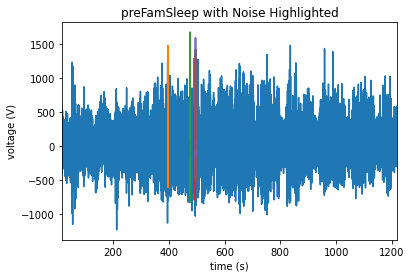

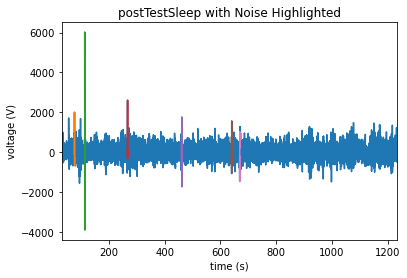

In [10]:
for r in [0, 1]:

    signal = lfp[rec_list[r]]

    ax = plt.gca()
    eeg = nel.filtering.sosfiltfilt(signal, fl=.01, fh=300)
    npl.plot(eeg)
    npl.plot(eeg[noisy_epochs[rec_list[r]]])
    ax.set_title(rec_list[r] + " with Noise Highlighted")
    plt.show()



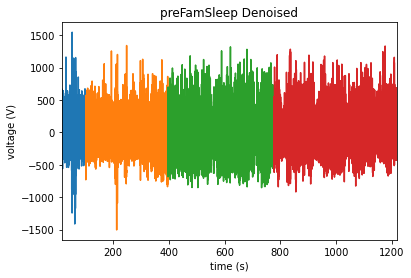

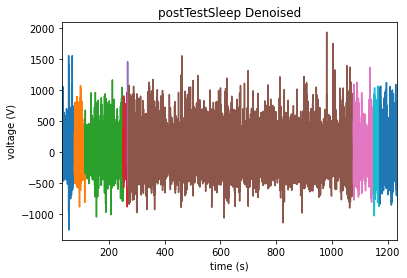

In [15]:
denoised = np.load(path, allow_pickle=True).item()

for r in [0, 1]:
    signal = lfp[rec_list[r]]
    ax = plt.gca()
    # npl.plot(signal, color='black')
    npl.plot(denoised[rec_list[r]])
    ax.set_title(rec_list[r] + " Denoised")
    plt.show()
    

## Look at Frequency Spectrum (CWT) of Remaining Signal .. Pass for Now

In [ ]:
# Calculate CWT across time for each 20 minute signal
# coefs_cwt, _, f_cwt, t_cwt, _ = gsp.cwt(data, fs=fs,freq_limits=[1, 500])
# psd_cwt = np.abs(coefs_cwt)**2 / fs

# data = denoised[rec_list[3]].data[0]
# fs = 30000

# coefs_cwt, _, f_cwt, t_cwt, _ = gsp.cwt(data, fs=fs,freq_limits=[1, 500])


## Detect Sleep and Wake Periods

In [3]:
# Filter for Theta/Delta Ratio and Calculate Throughout Signal
# total power in fast θ (6.6–9.0 Hz) band divided by total power in fast δ (2.5–4.0 Hz) band

In [29]:
np.size(signal.time)

3600000

In [74]:
signal = denoised['preFamSleep'].subsample(fs=3000)

theta = nel.filtering.sosfiltfilt(signal, fl=6.6, fh=9.0)
delta = nel.filtering.sosfiltfilt(signal, fl=2.5, fh=4.0)
theta_power = np.abs(theta.data[0])**2
delta_power = np.abs(delta.data[0])**2

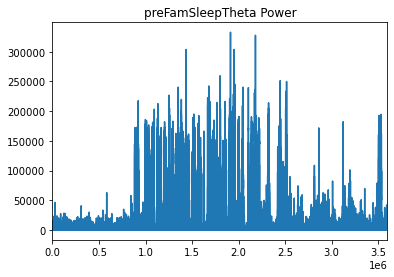

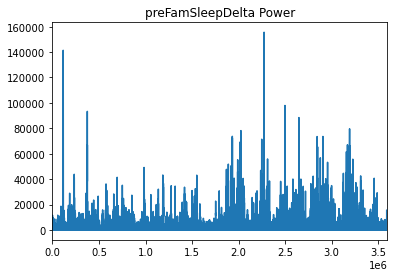

In [75]:
# Power of the Signal
# np.abs(theta)**2

ax = plt.gca()
# npl.plot(signal, label="Signal")
# npl.plot(theta, label="Theta")
npl.plot(theta_power, label="Theta Power")
ax.set_title(rec_list[0] + "Theta Power")
plt.show()

ax = plt.gca()
npl.plot(delta_power, label="Delta Power")
ax.set_title(rec_list[0] + "Delta Power")
plt.show()

In [81]:
# td_ratio = theta_power.data[0]/delta_power.data[0]
td_ratio = theta_power/delta_power

print(td_ratio)

td_envelope = nel.utils.signal_envelope_1d(td_ratio, sigma=0.004, fs=3000)[0]
td_ratio_pwr_z = nel.AnalogSignalArray(td_envelope, abscissa_vals=signal.time, fs=3000).normalize().smooth()

print(td_ratio_pwr_z)

[0.28057545 0.25399109 0.23032722 ... 7.48701762 6.88760918 6.98745927]
<AnalogSignalArray at 0x7f5848550320: 1 signals (6 segments)> for a total of 19:59:020 minutes


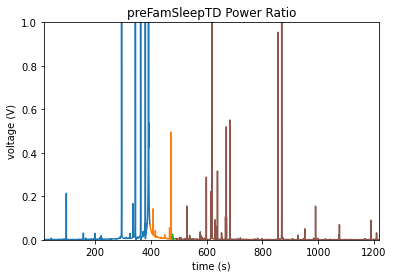

In [80]:

ax = plt.gca()
npl.plot(td_ratio_pwr_z, label="TD Power Ratio")
ax.set_title(rec_list[0] + "TD Power Ratio")
ax.set_ylim(0, 1)
plt.show()

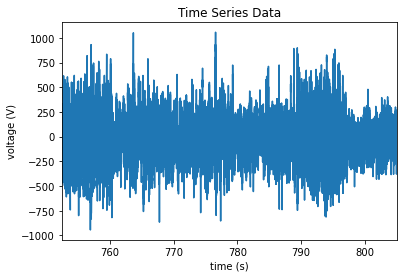

/home/kaylavokt/anaconda3/envs/analysis/lib/python3.6/site-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part


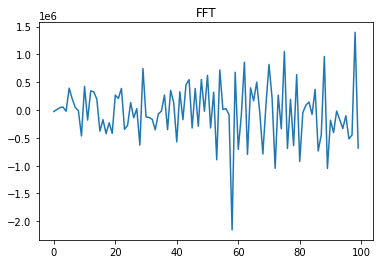

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

(<Figure size 432x288 with 2 Axes>,
 <AxesSubplot:title={'center':'Amplitude'}, xlabel='Time (sec)', ylabel='Frequency'>)

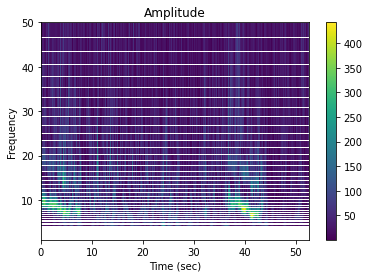

In [68]:

# ax = plt.gca()
# npl.plot(td_ratio_pwr_z, label="TD Power Ratio")
# ax.set_title(rec_list[0] + "TD Power Ratio")
# ax.set_ylim(0, .1)
# plt.show()

window = [752.5, 805]
signal = lfp['preFamSleep'].subsample(fs=3000)[nel.EpochArray(window)]

ax = plt.gca()
npl.plot(signal)
ax.set_title("Time Series Data")
plt.show()

ax = plt.gca()
plt.plot(fft(signal.data[0])[0:100])
ax.set_title("FFT")
plt.show()

coefs_cwt, _, f_cwt, t_cwt, _ = gsp.cwt(signal.data[0], fs=3000,freq_limits=[1, 50])
gsp.plot_wavelet_spectrogram(coefs_cwt, f_cwt,t_cwt)

[]

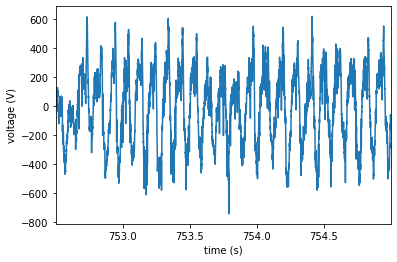

In [55]:
window = [752.5, 755]
signal = lfp['preFamSleep'].subsample(fs=3000)[nel.EpochArray(window)]

ax = plt.gca()
npl.plot(signal)
plt.plot()

In [27]:
len(theta_power)

3600000

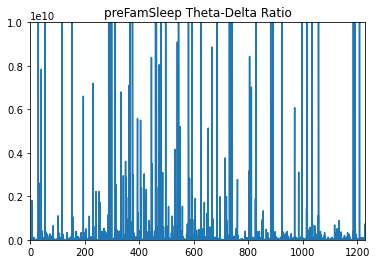

In [54]:
# Calculate Ratio
%matplotlib inline

ax = plt.gca()
npl.plot(theta.time, td_ratio, label="Theta-Delta Ratio")
ax.set_title(rec_list[0] + " Theta-Delta Ratio")
ax.set_ylim(0, 1e10)
plt.show()

## td_envelope = nel.utils.signal_envelope_1d(td_ratio, sigma=0.004)
## smooth td_ratio.smooth()
## Z-Score (normalize)


In [65]:
td_ratio<100

array([ True,  True,  True, ..., False, False, False])

## TD Ratio

In [10]:
td_ratios = {}

# Help -- how to interpret theta-delta ratio

# Calculate Ratio for all recording types
for r in [0, 1]:
    signal = denoised[rec_list[r]]
    theta = nel.filtering.sosfiltfilt(signal, fl=6.6, fh=9.0)
    delta = nel.filtering.sosfiltfilt(signal, fl=2.5, fh=4.0)
    theta_power = np.abs(theta.data[0])**2
    delta_power = np.abs(delta.data[0])**2
    td_ratio = theta_power/delta_power
    
    td_envelope = nel.utils.signal_envelope_1d(td_ratio, sigma=0.004, fs=3000)[0]
    td_ratio_pwr_z = nel.AnalogSignalArray(td_envelope, abscissa_vals=signal.time, fs=3000).normalize().smooth()
    
    td_ratios[rec_list[r]] = td_ratio_pwr_z

In [11]:
path = prefix + 'norm_pwr_td_ratio.npy'
np.save(path, td_ratios)
print("saved TD Ratios")

saved TD Ratios


## Detect Ripples for Each Signal

In [15]:
# Using Code from Unpack Whrath Data

In [12]:
def extract_ripples(asa, threshold1, threshold2):
    eeg = nel.filtering.sosfiltfilt(asa, fl=150, fh=250)
    env = nel.utils.signal_envelope_1d(eeg, sigma=0.004)
    bounds, _, _ = nel.utils.get_events_boundaries(env.data,
    PrimaryThreshold=threshold1,#env.mean() + 3*env.std(),
    SecondaryThreshold=threshold2,#env.mean(),
    minThresholdLength=0.015,
    minLength=0.05,
    ds=1/env.fs)
    timebounds = env.time[bounds]
    if(len(timebounds) == 0):
        return [] # no ripples found
    timebounds[:, 1] += 1/env.fs
    return nel.EpochArray(timebounds)

In [13]:
def find_ripple_segments(signal):
    # This function removes the short segments of the signal that are too small
    # to use filtering/ripple detection on
    return_segments = []
    segments = len(signal)
    for s in range(segments):
        signal_segment = signal[s]
        if signal_segment.time[-1] - signal_segment.time[0] > 0.01:
            if(len(return_segments) == 0):
                return_segments = signal_segment
            else:
                return_segments = return_segments.join(signal_segment)
    return return_segments
    

In [14]:
ripple_epochs = {}

for r in [0, 1]:
    signal = nel.filtering.sosfiltfilt(denoised[rec_list[r]],fl=0.1,fh=400).subsample(fs=3000)
    
    ripple_segments =  find_ripple_segments(signal)
    
    eeg = nel.filtering.sosfiltfilt(ripple_segments, fl=150, fh=250)
    env = nel.utils.signal_envelope_1d(eeg, sigma=0.004)
    primary_threshold = env.mean() + 3*env.std()
    secondary_threshold = env.mean()
    
    ripple_epochs[rec_list[r]] = extract_ripples(ripple_segments, primary_threshold, secondary_threshold)

print("PreFamSleepRipples = ", ripple_epochs['preFamSleep'])
print("PostTestSleepRipples = ", ripple_epochs['postTestSleep'])


/home/kaylavokt/nelpy/nelpy/utils.py:1225: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/home/kaylavokt/nelpy/nelpy/utils.py:1262: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/home/kaylavokt/nelpy/nelpy/utils.py:1263: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/home/kaylavokt/nelpy/nelpy/utils.py:1264: FutureWarnin

PreFamSleepRipples =  <EpochArray at 0x7f94be70a400: 166 epochs> of length 19.2852 seconds
PostTestSleepRipples =  <EpochArray at 0x7f94be70c3c8: 249 epochs> of length 28.49110000000000004 seconds


In [15]:
path = prefix + 'ripple_epochs.npy'
np.save(path, ripple_epochs)
print("saved Ripple Epochs")

saved Ripple Epochs


## Plot Ripple Epochs

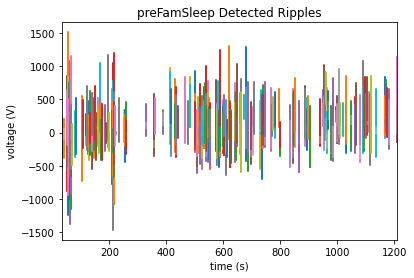

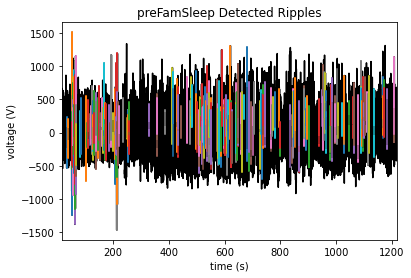

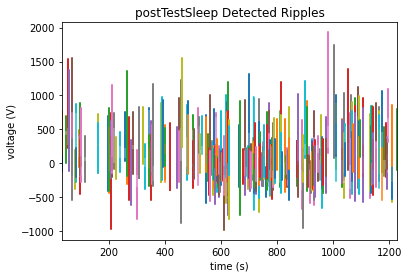

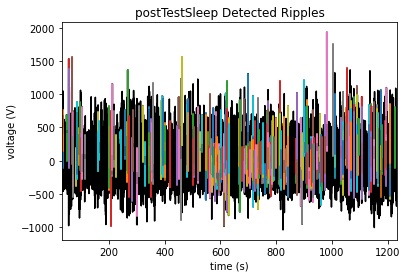

In [25]:
signal = denoised['preFamSleep'].subsample(fs=3000)

ax = plt.gca()
npl.plot(signal[ripple_epochs['preFamSleep']])
ax.set_title(rec_list[0] + " Detected Ripples")
plt.show()

ax = plt.gca()
npl.plot(signal, color = 'black')
npl.plot(signal[ripple_epochs['preFamSleep']])
ax.set_title(rec_list[0] + " Detected Ripples")
plt.show()

signal = denoised['postTestSleep'].subsample(fs=3000)

ax = plt.gca()
npl.plot(signal[ripple_epochs['postTestSleep']])
ax.set_title(rec_list[1] + " Detected Ripples")
plt.show()

ax = plt.gca()
npl.plot(signal, color = 'black')
npl.plot(signal[ripple_epochs['postTestSleep']])
ax.set_title(rec_list[1] + " Detected Ripples")
plt.show()


## Remove ~non~ Ripples

In [4]:
# Look at all Ripple Candidates and See Which Ones Actually are BAD??

{'preFamSleep': <EpochArray at 0x7f07c2907710: 307 epochs> of length 28.0897 seconds,
 'postTestSleep': <EpochArray at 0x7f07c291b7f0: 313 epochs> of length 32.8937 seconds}

preFamSleep Number of Ripples =  312


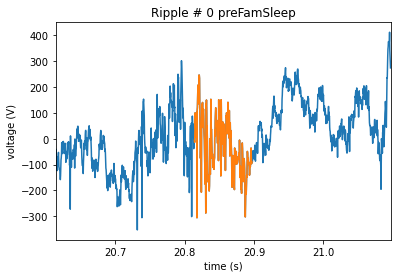

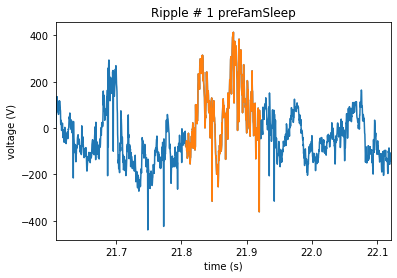

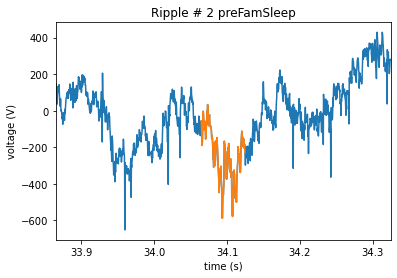

postTestSleep Number of Ripples =  269


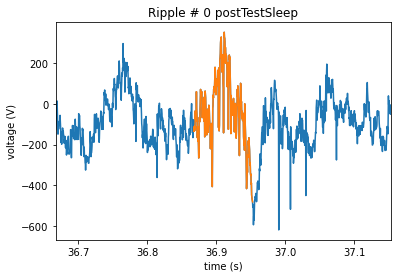

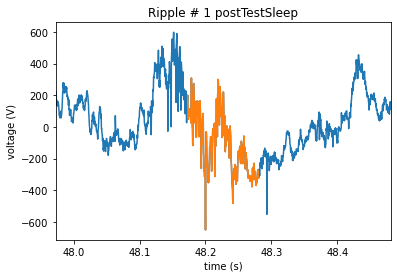

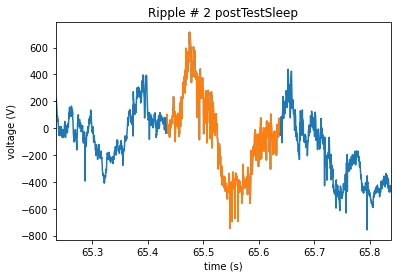

In [14]:
for r in [0, 1]:
    ripples = ripple_epochs[rec_list[r]]
    print(rec_list[r], "Number of Ripples = ", len(ripples))
    
    signal = lfp[rec_list[r]].subsample(fs=3000)
    
    for x in range(3):
        ax = plt.gca()
        npl.plot(signal[ripples[x].expand(0.2)])
        npl.plot(signal[ripples[x]])
        ax.set_title("Ripple # " + str(x) + " " + rec_list[r])
        plt.show()

## Join Ripples that are Close Together

In [98]:
# Considering Ripple Candidates
# Look at overall signal with Ripples Overlayed
# Look at ones close together

# asa = denoised['preFamSleep']
# ripples = ripple_epochs['preFamSleep']
# window = [0,100]

# ax = plt.gca()
# npl.plot(asa[nel.EpochArray(window)])
# npl.plot(asa[ripples])
# ax.set_title(rec_list[0] + " Detected Ripples")
# plt.show()

Number of Ripples Close together:  37 preFamSleep


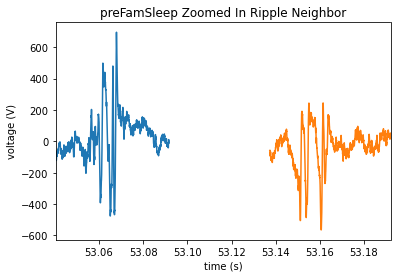

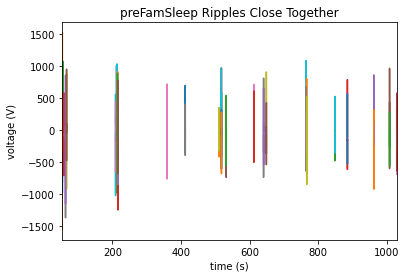

Number of Ripples Close together:  42 postTestSleep


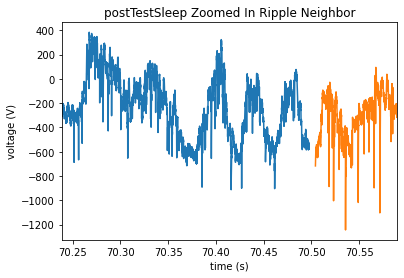

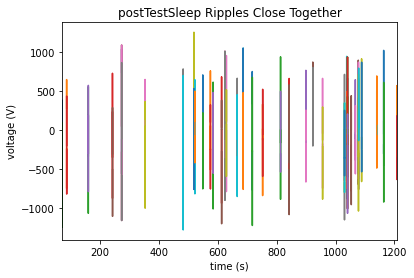

In [15]:
ripples = ripple_epochs['preFamSleep']
asa = denoised['preFamSleep']

for r in [0, 1]:
    ripples = ripple_epochs[rec_list[r]]
    asa = denoised[rec_list[r]]

    np.diff(ripples.time, axis = 0)

    trying = np.diff(ripples.time.flatten())
    diffs = np.where(trying[1::2] < .05) # the array indexing gives you every other element in the array
    print("Number of Ripples Close together: ", len(diffs[0]), rec_list[r])

    # Help -- how to join epoch arrays

    ax = plt.gca()
    i = int(diffs[0][0])    
    npl.plot(asa[ripples[i]])
    npl.plot(asa[ripples[i+1]])
    ax.set_title(rec_list[r] + " Zoomed In Ripple Neighbor")
    plt.show()

    ax = plt.gca()
    for i in diffs:
        npl.plot(asa[ripples[i]])
        npl.plot(asa[ripples[i+1]])
    ax.set_title(rec_list[r] + " Ripples Close Together")
    plt.show()

## Look at Spectral Info About Ripple Epochs

In [17]:
# Again use CWT to see ripple center frequency
# Save ripple center frequency info
import random

nums = np.random.randint(len(ripple_epochs['preFamSleep']), size=10)
nums

array([ 49, 158,  44,  68,  88, 141,  76,   6, 124, 163])

In [3]:
ripples = ripple_epochs[rec_list[0]]
signal = denoised[rec_list[0]].downsample(fs_out=3000)

coefs_cwt, _, f_cwt, t_cwt, _ = gsp.cwt(signal.data[0], fs=3000,freq_limits=[1, 300])
# gsp.plot_wavelet_spectrogram(coefs_cwt, f_cwt,t_cwt)

# for i in nums:
#     i = int(i)
#     ax = plt.gca()
    
#     npl.plot(signal[ripples[i].expand(0.2)])
#     npl.plot(signal[ripples[i]])
#     ax.set_title("Ripple # " + str(i) + " " + rec_list[0])
    
#     data = signal[ripples[i]].data[0]
#     fs = 30000
#     coefs_cwt, _, f_cwt, t_cwt, _ = gsp.cwt(data, fs=fs,freq_limits=[100, 400])
#     gsp.plot_wavelet_spectrogram(coefs_cwt, f_cwt,t_cwt)
    
#     xctr = np.argmax(coefs_cwt.max(axis=0))
#     yctr = np.argmax(coefs_cwt.max(axis=1))
    
#     # xctr = np.argmax(coefs_cwt, axis=0)
#     # yctr = np.argmax(coefs_cwt, axis=1)
    
#     plt.scatter(t_cwt[xctr], f_cwt[yctr], color='r', marker="^")
#     plt.show()

# gsp.plot_wavelet_spectrogram

# Help -- how to plot spectogram
# Help -- how to calculate ripple center frequency

# plt.pcolormesh(t_cwt, f_cwt, coefs_cwt, shading='gouraud')
# plt.ylabel('Frequency [Hz]')
# plt.xlabel('Time [sec]')
# plt.show()

In [62]:
prefix = '/home/kaylavokt/Desktop/Whrath/Control_Day4/'
ripple_center_frequency[rec_list[0]] = ctr_frequency

path = prefix + 'ripple_center_frequency.npy'
np.save(path, ripple_center_frequency)
print("saved ripple_center_frequency")

saved ripple_center_frequency


## Get Ripple Center Frequency

In [ ]:
ripple_center_frequency = {}

# for r in [0, 1]:

r = 1

ctr_frequency = []
ripples = ripple_epochs[rec_list[r]]
signal = lfp[rec_list[r]]
num_ripples = len(ripple_epochs[rec_list[r]])

for i in range(num_ripples):

    data = signal[ripples[i]].data[0]
    fs = 30000
    coefs_cwt, _, f_cwt, t_cwt, _ = gsp.cwt(data, fs=fs,freq_limits=[100, 400])

    xctr = np.argmax(coefs_cwt.max(axis=0))
    yctr = np.argmax(coefs_cwt.max(axis=1))

    ctr_frequency.append(f_cwt[yctr])
    
    
        
#     ripple_center_frequency[rec_list[0]] = ctr_frequency

# path = prefix + 'ripple_center_frequency.npy'
# np.save(path, ripple_center_frequency)
# print("saved ripple_center_frequency")

/home/kaylavokt/anaconda3/envs/analysis/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).


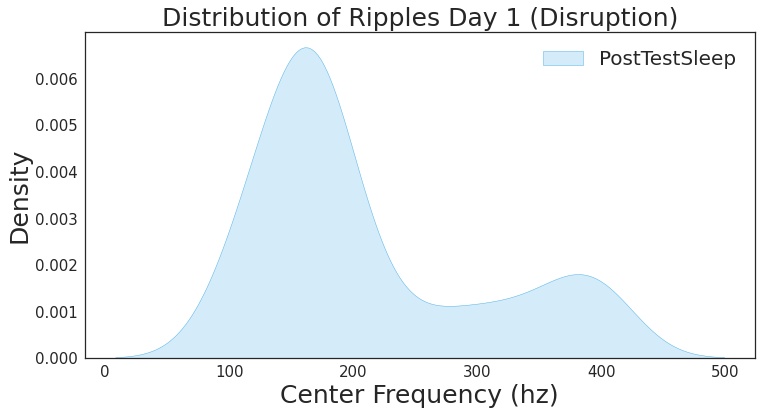

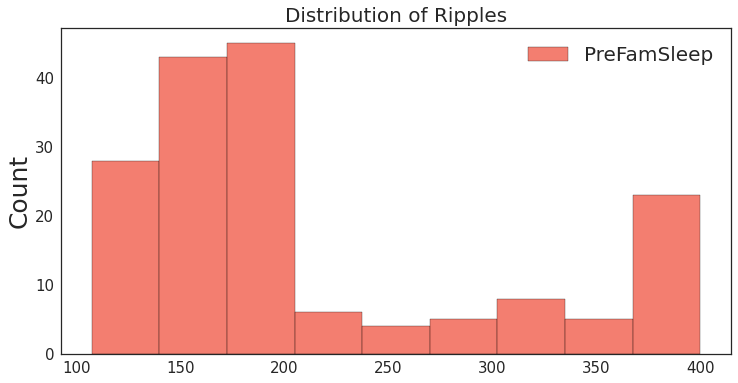

## Look at Ripple Duration Distributions

/home/kaylavokt/anaconda3/envs/analysis/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
/home/kaylavokt/anaconda3/envs/analysis/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).


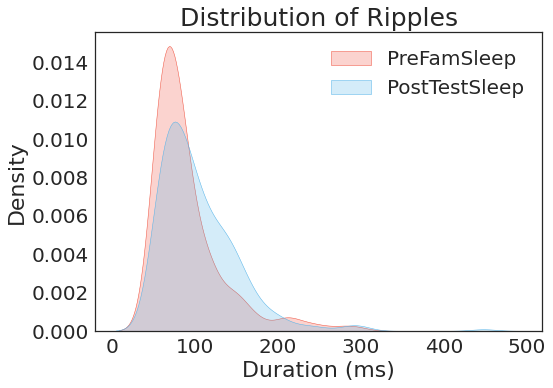

In [94]:
# Create Histograms for Each Session
# Distribution of All Ripples
import seaborn as sns

ripples = ripple_epochs[rec_list[0]]
ripples1 = ripple_epochs[rec_list[1]]

ax = plt.gca()
npl.setup()
npl.set_palette(npl.colors.cows)
npl.setup(font_scale=2, style='white',\
         rc=({'figure.figsize': (12, 6), 'font.size': 18, 'axes.labelsize': 25, \
             'axes.titlesize':25, 'legend.fontsize': 20, 'ytick.labelsize': 15, 'xtick.labelsize': 15}))

sns.distplot(ripples.lengths*1000,color=npl.colors.sweet.red,kde=True,hist=False,kde_kws = {'shade': True, 'linewidth': 0.5},label='PreFamSleep')
sns.distplot(ripples1.lengths*1000,color=npl.colors.sweet.blue,kde=True,hist=False,kde_kws = {'shade': True, 'linewidth': 0.5},label='PostTestSleep')
ax.set_title("Distribution of Ripples")
ax.set_xlabel("Duration (ms)")
ax.set_ylabel("Density")
plt.legend()
plt.show()

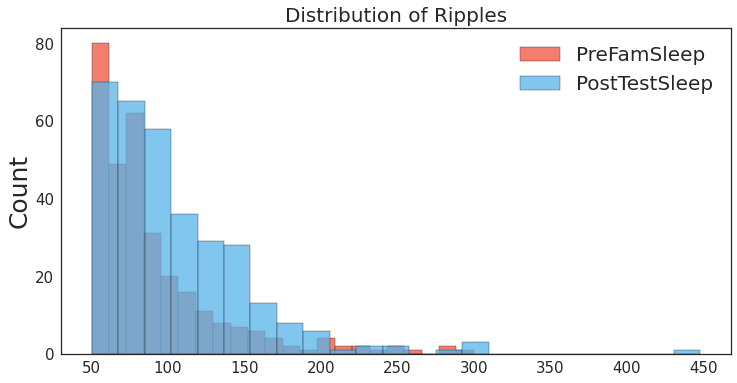

In [95]:
# Histogram

ax = plt.gca()
npl.setup(font_scale=2, style='white',\
         rc=({'axes.titlesize':20}))   
sns.histplot(ripples.lengths*1000, color=npl.colors.sweet.red, label='PreFamSleep')
sns.histplot(ripples1.lengths*1000, color=npl.colors.sweet.blue, label='PostTestSleep')
ax.set_title("Distribution of Ripples")
plt.legend()
plt.show()

### **Ripple Disruption Pipeline**

## Detect Stimulation Artifacts

In [89]:
# Remove periods of stimulation

In [4]:
from scipy.signal import find_peaks

prefix = '/home/kaylavokt/Desktop/Whrath/Day1/'
rec_list = ['preFamSleep', 'fam', 'postFamSleep', 'test', 'postTestSleep']

# lfp = {}
# for i in range(5):
#     rec = rec_list[i]
#     channels = [27]
#     lfp[rec] = loadUpData(prefix, rec, channels, True)
# rec_list at index 1 and 2 are stimulation periods

fam = lfp[rec_list[1]]
postFam = lfp[rec_list[2]]


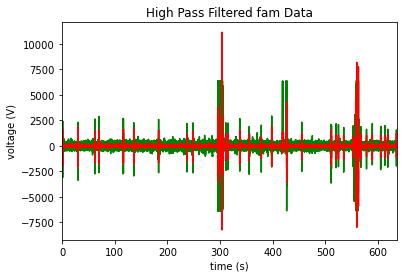

76


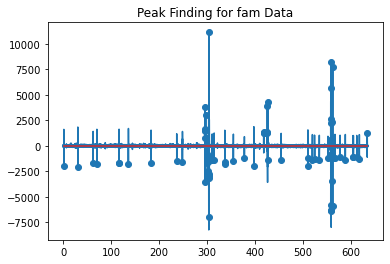

In [9]:
hp = nel.filtering.sosfiltfilt(fam, fl=300, fh=3000)
ax = plt.gca()
npl.plot(fam, color='green')
npl.plot(hp, color='red')
ax.set_title("High Pass Filtered fam Data")
plt.show()

fam_peaks, _ = find_peaks(np.abs(hp.data[0]), distance=3500,prominence=fam.mean()+fam.std())
print(len(fam_peaks))
ax = plt.gca()
plt.plot(hp.time,hp.data[0])
plt.stem(hp.time[fam_peaks],hp.data[0][fam_peaks])
ax.set_title("Peak Finding for fam Data")
plt.show()

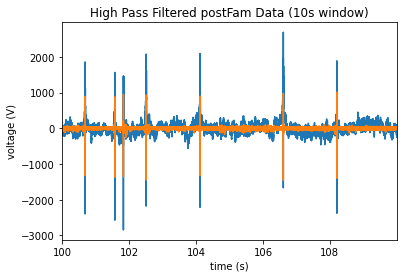

771


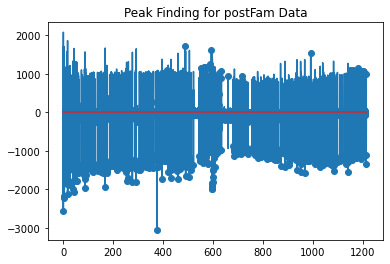

In [11]:
window = [100, 110]
hp = nel.filtering.sosfiltfilt(postFam, fl=300, fh=3000)

ax = plt.gca()
npl.plot(postFam[nel.EpochArray(window)])
npl.plot(hp[nel.EpochArray(window)])
ax.set_title("High Pass Filtered postFam Data (10s window)")
plt.show()

postFam_peaks, _ = find_peaks(np.abs(hp.data[0]), distance=3500,prominence=postFam.mean()+postFam.std())
print(len(postFam_peaks))

ax = plt.gca()
plt.plot(hp.time,hp.data[0])
plt.stem(hp.time[postFam_peaks],hp.data[0][postFam_peaks])
ax.set_title("Peak Finding for postFam Data")
plt.show()

In [42]:
# Look at every peak window
fam_peak_epochs = []

# Help -- Analog Signal Array Stuff, how do I make this into one signal?

for p in fam_peaks:
    peak_time = fam.time[p]
    fam_peak_epochs.append(fam[nel.EpochArray([peak_time,peak_time]).expand(0.1)])

len(fam_peak_epochs)

76

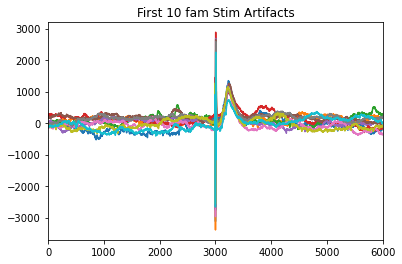

In [43]:
# First 10 Stim Artifacts look great!!

ax = plt.gca()

for i in range(10):
    npl.plot(fam_peak_epochs[i].data[0])
    
ax.set_title("First 10 fam Stim Artifacts")
plt.show()


## Repeat Ripple Detection

In [20]:
# Remove noise, count remaining ripples and find their ripple frequency

## Trashed Code

In [21]:
# mean = signal.mean()
# diff = 3*signal.std()
# idx = np.where(nel.utils.signal_envelope_1d(signal, sigma=0.004).data[0] > (mean+diff))

# y = signal.data[0][idx]
# x = signal.time[idx]



In [ ]:
coefs_cwt

val = np.argmax(coefs_cwt.flatten())
row, col = np.unravel_index(val, coefs_cwt.shape)

row,col


xctr = np.argmax(coefs_cwt.max(axis=0))
yctr = np.argmax(coefs_cwt.max(axis=1))

xctr, yctr